In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df1 = pd.read_csv('Strategy_Challenge_Development_Data_vF.csv')
df2 = pd.read_csv('Strategy_Challenge_Leaderboard_Data_vF.csv')
df3 = pd.read_csv('Strategy_Challenge_Sample_Submission_File_vF.csv')

In [3]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
def preprocessing(df,n):
    X = []
    for key in df.keys():
        if df[key].dtypes==object:
            X.append(le.fit_transform(df[key]))
            
        else:
            if any(df[key].isna()):
                mean_val = df[key].mean()
                df[key].fillna(value=mean_val, inplace=True)
            X.append(np.array(df[key]))
            
    X = X[1:n][:]
    return  np.vstack(X).T

In [4]:
n = df2.shape[1]
data1 = preprocessing(df1,n)
data2 = preprocessing(df2,n)

idx = df2['unique_id']

In [5]:
dlog1 = data1
dlog2 = data2

In [30]:
def scatter_plot3D(pca_data):
    x, y, z = pca_data[:,:3].T
    fig = px.scatter_3d(x = x, 
                        y = y, 
                        z = z)
    # fig = px.bar(x=["a", "b", "c"], y=[1, 3, 2])
    fig.write_html('first_figure.html', auto_open=True)
    
def scree_plot(pca, scaler):
    per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
    labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

    plt.figure(figsize = (12,7))
    plt.bar(x = range(1,len(per_var)+1), height = per_var, tick_label = labels)
    plt.plot(range(1,len(per_var)+1), per_var, c = 'red')
    plt.ylabel('Percentage of Explained Variance', size = 13)
    plt.xlabel('Principal Components', size = 13)
    plt.title('Scree Plot (%s)' %(scaler), size = 15)
    plt.grid()
    plt.show()
    print('%s%% variance of the dataset lies on the first 3 Principal Components'  %(np.sum(per_var[:3])))

    
# scatter_plot3D(pca_data)

In [31]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler
import plotly.express as px
from sklearn.cluster import MiniBatchKMeans, KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
# from sklearn_extra.cluster import KMea


Xminmax = MinMaxScaler().fit_transform(dlog1)
Xminabs = MaxAbsScaler().fit_transform(dlog1)
# valminmax = MinMaxScaler().fit(dlog2)

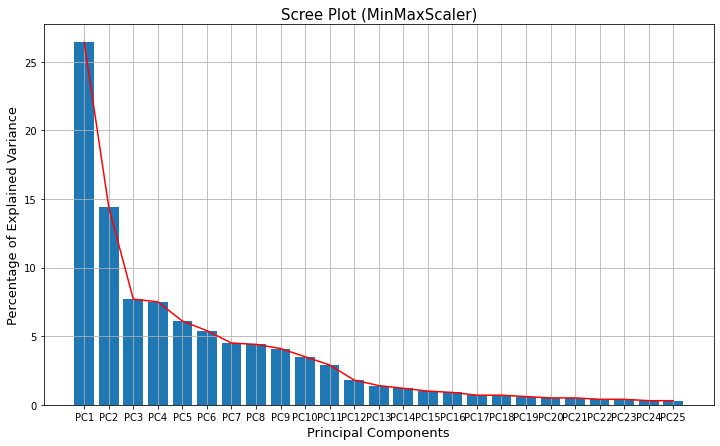

48.5% variance of the dataset lies on the first 3 Principal Components


In [37]:
pca = PCA(n_components = 25)
pca.fit(Xminmax)
pca_data = pca.transform(Xminmax)


scree_plot(pca, 'MinMaxScaler')

scatter_plot3D(pca_data)

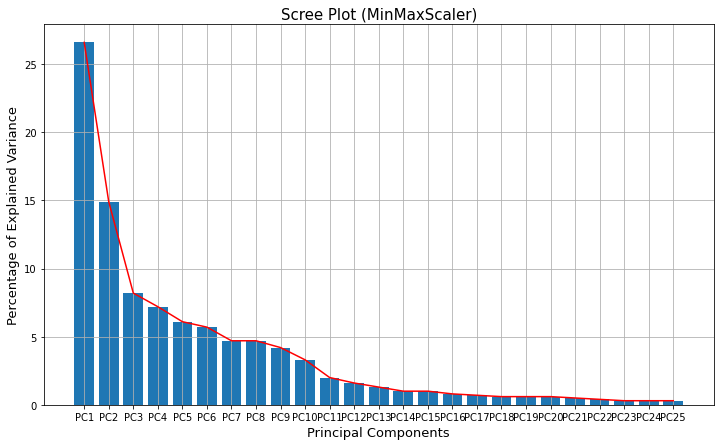

49.7% variance of the dataset lies on the first 3 Principal Components


In [38]:
pca = PCA(n_components = 25)
pca.fit(Xminabs)
pca_data = pca.transform(Xminabs)


scree_plot(pca, 'MinMaxScaler')

scatter_plot3D(pca_data)

In [39]:
pca = PCA(n_components = 17)
pca.fit(Xminmax)
pca_data = pca.transform(Xminmax)
top3_pc = pca_data[:,:3]

In [44]:
inertia = []
silh = []

for i in range(3,9):
    print(i)
    kmeans = KMeans(n_clusters = i) 
    kmeans.fit(top3_pc)
    inertia.append(kmeans.inertia_)
    silh.append(silhouette_score(top3_pc, kmeans.labels_))
    

3
4
5
6
7
8


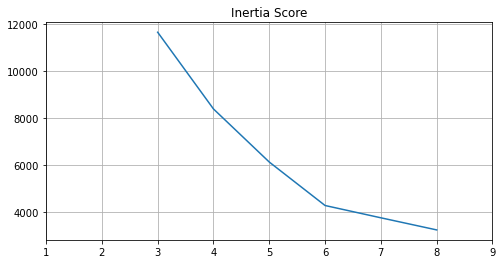

In [46]:
plt.figure(figsize = (8,4))
plt.plot(range(3,9), inertia)
plt.title('Inertia Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

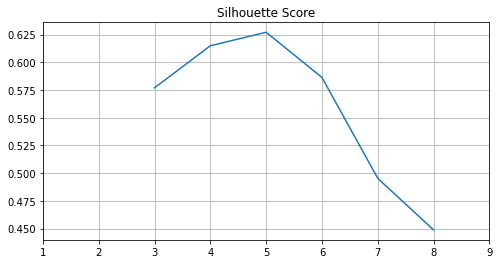

In [47]:
plt.figure(figsize = (8,4))
plt.plot(range(3,9), silh)
plt.title('Silhouette Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

In [48]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(top3_pc)
kmeans_labels = kmeans.labels_

x, y, z = top3_pc.T

fig = px.scatter_3d(x = x, 
                    y = y, 
                    z = z,
                    color = kmeans_labels)
fig.write_html('first_figure.html', auto_open=True)
fig.show()